<center><h1 class="list-group-item list-group-item-success"><font size = 6>Image Captioning - Transfer Learning</font></h1></center><br>
# GPT2+CLIP
## GPT
GPT-2 is a large transformer-based language model with 1.5 billion parameters, trained on a dataset[1] of 8 million web pages. GPT-2 is trained with a simple objective: predict the next word, given all of the previous words within some text. The diversity of the dataset causes this simple goal to contain naturally occurring demonstrations of many tasks across diverse domains. GPT-2 is a direct scale-up of GPT, with more than 10X the parameters and trained on more than 10X the amount of data.
## CLIP
CLIP (Contrastive Language-Image Pre-Training) is a neural network trained on a variety of (image, text) pairs. It can be instructed in natural language to predict the most relevant text snippet, given an image, without directly optimizing for the task, similarly to the zero-shot capabilities of GPT-2 and 3. We found CLIP matches the performance of the original ResNet50 on ImageNet “zero-shot” without using any of the original 1.28M labeled examples, overcoming several major challenges in computer vision.

![](https://www.kdnuggets.com/wp-content/uploads/brem_clip_model_04.jpg)

The CLIP model consists of two sub-models called encoders:

- a text encoder that will embed (smash) text into mathematical space.
- an image encoder that will embed (smash) images into mathematical space.

In [ ]:
!pip install transformers
!pip install git+https://github.com/openai/CLIP.git


In [1]:
import clip
import os
from torch import nn
import numpy as np
import torch
import torch.nn.functional as nnf
import sys
from typing import Tuple, List, Union, Optional
from transformers import GPT2Tokenizer, GPT2LMHeadModel, AdamW, get_linear_schedule_with_warmup
from tqdm import tqdm, trange
import skimage.io as io
import PIL.Image
from IPython.display import Image 


N = type(None)
V = np.array
ARRAY = np.ndarray
ARRAYS = Union[Tuple[ARRAY, ...], List[ARRAY]]
VS = Union[Tuple[V, ...], List[V]]
VN = Union[V, N]
VNS = Union[VS, N]
T = torch.Tensor
TS = Union[Tuple[T, ...], List[T]]
TN = Optional[T]
TNS = Union[Tuple[TN, ...], List[TN]]
TSN = Optional[TS]
TA = Union[T, ARRAY]


D = torch.device
CPU = torch.device('cpu')


def get_device(device_id: int) -> D:
    if not torch.cuda.is_available():
        return CPU
    device_id = min(torch.cuda.device_count() - 1, device_id)
    return torch.device(f'cuda:{device_id}')


CUDA = get_device

In [2]:
class MLP(nn.Module):

    def forward(self, x: T) -> T:
        return self.model(x)

    def __init__(self, sizes: Tuple[int, ...], bias=True, act=nn.Tanh):
        super(MLP, self).__init__()
        layers = []
        for i in range(len(sizes) -1):
            layers.append(nn.Linear(sizes[i], sizes[i + 1], bias=bias))
            if i < len(sizes) - 2:
                layers.append(act())
        self.model = nn.Sequential(*layers)


class ClipCaptionModel(nn.Module):

    #@functools.lru_cache #FIXME
    def get_dummy_token(self, batch_size: int, device: D) -> T:
        return torch.zeros(batch_size, self.prefix_length, dtype=torch.int64, device=device)

    def forward(self, tokens: T, prefix: T, mask: Optional[T] = None, labels: Optional[T] = None):
        embedding_text = self.gpt.transformer.wte(tokens)
        prefix_projections = self.clip_project(prefix).view(-1, self.prefix_length, self.gpt_embedding_size)
        #print(embedding_text.size()) #torch.Size([5, 67, 768])
        #print(prefix_projections.size()) #torch.Size([5, 1, 768])
        embedding_cat = torch.cat((prefix_projections, embedding_text), dim=1)
        if labels is not None:
            dummy_token = self.get_dummy_token(tokens.shape[0], tokens.device)
            labels = torch.cat((dummy_token, tokens), dim=1)
        out = self.gpt(inputs_embeds=embedding_cat, labels=labels, attention_mask=mask)
        return out

    def __init__(self, prefix_length: int, prefix_size: int = 512):
        super(ClipCaptionModel, self).__init__()
        self.prefix_length = prefix_length
        self.gpt = GPT2LMHeadModel.from_pretrained('gpt2')
        self.gpt_embedding_size = self.gpt.transformer.wte.weight.shape[1]
        if prefix_length > 10:  # not enough memory
            self.clip_project = nn.Linear(prefix_size, self.gpt_embedding_size * prefix_length)
        else:
            self.clip_project = MLP((prefix_size, (self.gpt_embedding_size * prefix_length) // 2, self.gpt_embedding_size * prefix_length))


class ClipCaptionPrefix(ClipCaptionModel):

    def parameters(self, recurse: bool = True):
        return self.clip_project.parameters()

    def train(self, mode: bool = True):
        super(ClipCaptionPrefix, self).train(mode)
        self.gpt.eval()
        return self

## The Beam Search Algorithm
Beam search is an algorithm used in many NLP and speech recognition models as a final decision making layer to choose the best output given target variables like maximum probability or next output character. First used for speech recognition in 1976, beam search is used often in models that have encoders and decoders with LSTM or Gated Recurrent Unit modules built in. To understand where this algorithm is used a little more let's take a look at how NLP models generate output, to see where Beam search comes into play.

The beam search algorithm selects multiple tokens for a position in a given sequence based on conditional probability. The algorithm can take any number of N best alternatives through a hyperparameter know as Beam width. In greedy search we simply took the best word for each position in the sequence, where here we broaden our search or "width" to include other words that might fit better.

![](https://miro.medium.com/max/1392/1*HpqyxSc_xpDswrSUodiwKw.png)

In [3]:
def generate_beam(model, tokenizer, beam_size: int = 5, prompt=None, embed=None,
                  entry_length=67, temperature=1., stop_token: str = '.'):

    model.eval()
    stop_token_index = tokenizer.encode(stop_token)[0]
    tokens = None
    scores = None
    device = next(model.parameters()).device
    seq_lengths = torch.ones(beam_size, device=device)
    is_stopped = torch.zeros(beam_size, device=device, dtype=torch.bool)
    with torch.no_grad():
        if embed is not None:
            generated = embed
        else:
            if tokens is None:
                tokens = torch.tensor(tokenizer.encode(prompt))
                tokens = tokens.unsqueeze(0).to(device)
                generated = model.gpt.transformer.wte(tokens)
        for i in range(entry_length):
            outputs = model.gpt(inputs_embeds=generated)
            logits = outputs.logits
            logits = logits[:, -1, :] / (temperature if temperature > 0 else 1.0)
            logits = logits.softmax(-1).log()
            if scores is None:
                scores, next_tokens = logits.topk(beam_size, -1)
                generated = generated.expand(beam_size, *generated.shape[1:])
                next_tokens, scores = next_tokens.permute(1, 0), scores.squeeze(0)
                if tokens is None:
                    tokens = next_tokens
                else:
                    tokens = tokens.expand(beam_size, *tokens.shape[1:])
                    tokens = torch.cat((tokens, next_tokens), dim=1)
            else:
                logits[is_stopped] = -float(np.inf)
                logits[is_stopped, 0] = 0
                scores_sum = scores[:, None] + logits
                seq_lengths[~is_stopped] += 1
                scores_sum_average = scores_sum / seq_lengths[:, None]
                scores_sum_average, next_tokens = scores_sum_average.view(-1).topk(beam_size, -1)
                next_tokens_source = next_tokens // scores_sum.shape[1]
                seq_lengths = seq_lengths[next_tokens_source]
                next_tokens = next_tokens % scores_sum.shape[1]
                next_tokens = next_tokens.unsqueeze(1)
                tokens = tokens[next_tokens_source]
                tokens = torch.cat((tokens, next_tokens), dim=1)
                generated = generated[next_tokens_source]
                scores = scores_sum_average * seq_lengths
                is_stopped = is_stopped[next_tokens_source]
            next_token_embed = model.gpt.transformer.wte(next_tokens.squeeze()).view(generated.shape[0], 1, -1)
            generated = torch.cat((generated, next_token_embed), dim=1)
            is_stopped = is_stopped + next_tokens.eq(stop_token_index).squeeze()
            if is_stopped.all():
                break
    scores = scores / seq_lengths
    output_list = tokens.cpu().numpy()
    output_texts = [tokenizer.decode(output[:int(length)]) for output, length in zip(output_list, seq_lengths)]
    order = scores.argsort(descending=True)
    output_texts = [output_texts[i] for i in order]
    return output_texts

In [4]:


def generate2(
        model,
        tokenizer,
        tokens=None,
        prompt=None,
        embed=None,
        entry_count=1,
        entry_length=67,  # maximum number of words
        top_p=0.8,
        temperature=1.,
        stop_token: str = '.',
):
    model.eval()
    generated_num = 0
    generated_list = []
    stop_token_index = tokenizer.encode(stop_token)[0]
    filter_value = -float("Inf")
    device = next(model.parameters()).device

    with torch.no_grad():

        for entry_idx in trange(entry_count):
            if embed is not None:
                generated = embed
            else:
                if tokens is None:
                    tokens = torch.tensor(tokenizer.encode(prompt))
                    tokens = tokens.unsqueeze(0).to(device)

                generated = model.gpt.transformer.wte(tokens)

            for i in range(entry_length):

                outputs = model.gpt(inputs_embeds=generated)
                logits = outputs.logits
                logits = logits[:, -1, :] / (temperature if temperature > 0 else 1.0)
                sorted_logits, sorted_indices = torch.sort(logits, descending=True)
                cumulative_probs = torch.cumsum(nnf.softmax(sorted_logits, dim=-1), dim=-1)
                sorted_indices_to_remove = cumulative_probs > top_p
                sorted_indices_to_remove[..., 1:] = sorted_indices_to_remove[
                                                    ..., :-1
                                                    ].clone()
                sorted_indices_to_remove[..., 0] = 0

                indices_to_remove = sorted_indices[sorted_indices_to_remove]
                logits[:, indices_to_remove] = filter_value
                next_token = torch.argmax(logits, -1).unsqueeze(0)
                next_token_embed = model.gpt.transformer.wte(next_token)
                if tokens is None:
                    tokens = next_token
                else:
                    tokens = torch.cat((tokens, next_token), dim=1)
                generated = torch.cat((generated, next_token_embed), dim=1)
                if stop_token_index == next_token.item():
                    break

            output_list = list(tokens.squeeze().cpu().numpy())
            output_text = tokenizer.decode(output_list)
            generated_list.append(output_text)

    return generated_list[0]

In [5]:
pretrained_model = 'Conceptual captions'


In [6]:
is_gpu = True

## ViT
The Vision Transformer (ViT) model was introduced in a research paper published as a conference paper at ICLR 2021 titled “An Image is Worth 16*16 Words: Transformers for Image Recognition at Scale”. It was developed and published by Neil Houlsby, Alexey Dosovitskiy, and 10 more authors of the Google Research Brain Team.
The overall architecture of the vision transformer model is given as follows in a step-by-step manner:

1. Split an image into patches (fixed sizes)
2. Flatten the image patches
3. Create lower-dimensional linear embeddings from these flattened image patches
4. Include positional embeddings
5. Feed the sequence as an input to a state-of-the-art transformer encoder
6. Pre-train the ViT model with image labels, which is then fully supervised on a big dataset
7. Fine-tune on the downstream dataset for image classification

![](https://viso.ai/wp-content/uploads/2021/09/vision-transformer-vit.png)

In [7]:
device = CUDA(0) if is_gpu else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device, jit=False)
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")

In [8]:
prefix_length = 10

model = ClipCaptionModel(prefix_length)

model.load_state_dict(torch.load("../input/gptpretrained/model_wieghts.pt", map_location=CPU)) 

model = model.eval() 
device = CUDA(0) if is_gpu else "cpu"
model = model.to(device)

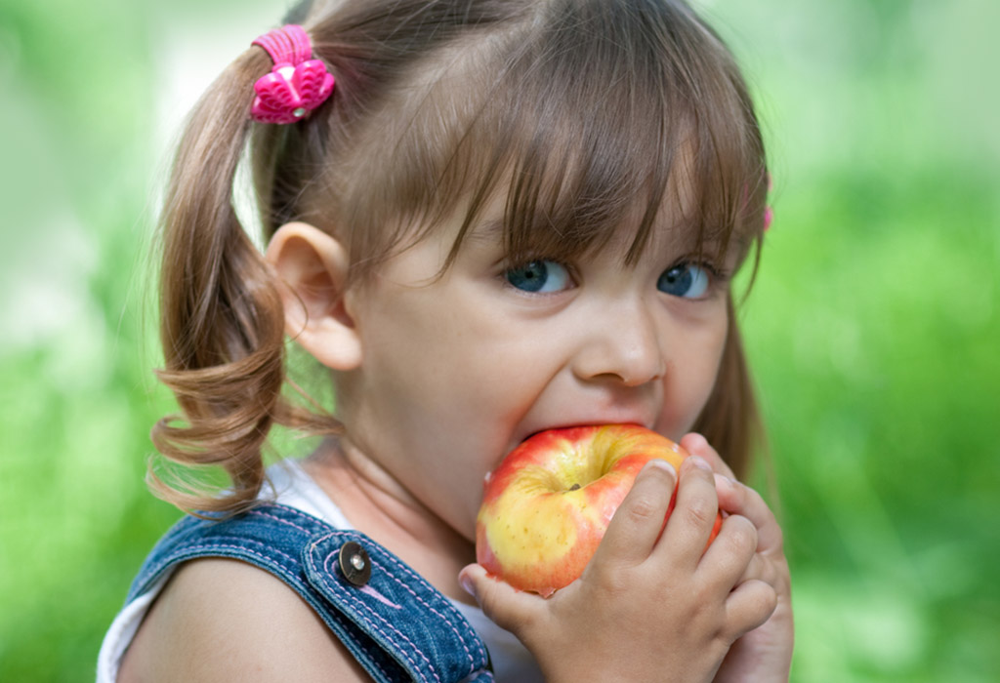

/root/.local/lib/python3.7/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)




cute little girl eating an apple in the garden.


In [9]:
use_beam_search = True  

image = io.imread("https://cdn.cdnparenting.com/articles/2018/01/61253515-H.jpg")
pil_image = PIL.Image.fromarray(image)
display(pil_image)

image = preprocess(pil_image).unsqueeze(0).to(device)
with torch.no_grad():
    prefix = clip_model.encode_image(image).to(device, dtype=torch.float32)
    prefix_embed = model.clip_project(prefix).reshape(1, prefix_length, -1)
if use_beam_search:
    generated_text_prefix = generate_beam(model, tokenizer, embed=prefix_embed)[0]
else:
    generated_text_prefix = generate2(model, tokenizer, embed=prefix_embed)


print('\n')
print(generated_text_prefix)

## GPU Clean Up

In [10]:
def fun(tensor):
    print(torch.cuda.memory_allocated() / 1024**2)
    # Delete local reference
    del tensor
    print(torch.cuda.memory_allocated() / 1024**2)
    torch.cuda.empty_cache()
    return

In [11]:
fun(model)
fun(clip_model)
fun(tokenizer)
import gc
gc.collect()

950.93212890625
950.93212890625
950.93212890625
950.93212890625
950.93212890625
950.93212890625


404

# OFA variation
OFA is a unified multimodal pretrained model that unifies modalities (i.e., cross-modality, vision, language) and tasks (e.g., image generation, visual grounding, image captioning, image classification, text generation, etc.) to a simple sequence-to-sequence learning framework.

![](https://gcdnb.pbrd.co/images/Paogk2xQZcSS.png?o=1)


In [ ]:
!git clone https://github.com/karan-vk/OFA-variation

In [ ]:
! git clone https://github.com/pytorch/fairseq.git
! pip install --use-feature=in-tree-build ./fairseq

In [ ]:
!pip install -r OFA-variation/requirements.txt

In [12]:
%cd ./OFA-variation

/kaggle/working/OFA-variation


In [13]:
import torch
import numpy as np
from fairseq import utils,tasks
from fairseq import checkpoint_utils
from utils.eval_utils import eval_step
from tasks.mm_tasks.caption import CaptionTask
from models.ofa import OFAModel
from PIL import Image

# Register caption task
tasks.register_task('caption',CaptionTask)

# turn on cuda if GPU is available
use_cuda = torch.cuda.is_available()
# use fp16 only when GPU is available
use_fp16 = False

In [14]:
# Load pretrained ckpt & config
overrides={"bpe_dir":"utils/BPE", "eval_cider":False, "beam":5, "max_len_b":16, "no_repeat_ngram_size":3, "seed":7}
models, cfg, task = checkpoint_utils.load_model_ensemble_and_task(
        utils.split_paths('/kaggle/input/ofavariationcaption/caption.pt'),
        arg_overrides=overrides
    )

# Move models to GPU
for model in models:
    model.eval()
    if use_fp16:
        model.half()
    if use_cuda and not cfg.distributed_training.pipeline_model_parallel:
        model.cuda()
    model.prepare_for_inference_(cfg)

# Initialize generator
generator = task.build_generator(models, cfg.generation)

In [15]:
# Image transform
from torchvision import transforms
mean = [0.5, 0.5, 0.5]
std = [0.5, 0.5, 0.5]

patch_resize_transform = transforms.Compose([
    lambda image: image.convert("RGB"),
    transforms.Resize((cfg.task.patch_image_size, cfg.task.patch_image_size), interpolation=Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Text preprocess
bos_item = torch.LongTensor([task.src_dict.bos()])
eos_item = torch.LongTensor([task.src_dict.eos()])
pad_idx = task.src_dict.pad()
def encode_text(text, length=None, append_bos=False, append_eos=False):
    s = task.tgt_dict.encode_line(
        line=task.bpe.encode(text),
        add_if_not_exist=False,
        append_eos=False
    ).long()
    if length is not None:
        s = s[:length]
    if append_bos:
        s = torch.cat([bos_item, s])
    if append_eos:
        s = torch.cat([s, eos_item])
    return s

# Construct input for caption task
def construct_sample(image: Image):
    patch_image = patch_resize_transform(image).unsqueeze(0)
    patch_mask = torch.tensor([True])
    src_text = encode_text(" what does the image describe?", append_bos=True, append_eos=True).unsqueeze(0)
    src_length = torch.LongTensor([s.ne(pad_idx).long().sum() for s in src_text])
    sample = {
        "id":np.array(['42']),
        "net_input": {
            "src_tokens": src_text,
            "src_lengths": src_length,
            "patch_images": patch_image,
            "patch_masks": patch_mask
        }
    }
    return sample
  
# Function to turn FP32 to FP16
def apply_half(t):
    if t.dtype is torch.float32:
        return t.to(dtype=torch.half)
    return t

/root/.local/lib/python3.7/site-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


In [16]:
# Download an image from COCO or you can use other images with wget
! wget https://www.indiewire.com/wp-content/uploads/2021/06/Yoda.png
! mv Yoda.png  test.jpg
image = Image.open('./test.jpg')

# Construct input sample & preprocess for GPU if cuda available
sample = construct_sample(image)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

--2022-03-07 18:10:57--  https://www.indiewire.com/wp-content/uploads/2021/06/Yoda.png
Resolving www.indiewire.com (www.indiewire.com)... 192.0.66.2
Connecting to www.indiewire.com (www.indiewire.com)|192.0.66.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6187104 (5.9M) [image/png]
Saving to: ‘Yoda.png’

Yoda.png            100%[===================>]   5.90M  --.-KB/s    in 0.1s    

2022-03-07 18:10:58 (57.2 MB/s) - ‘Yoda.png’ saved [6187104/6187104]



In [17]:
# Run eval step for caption
with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

/root/.local/lib/python3.7/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


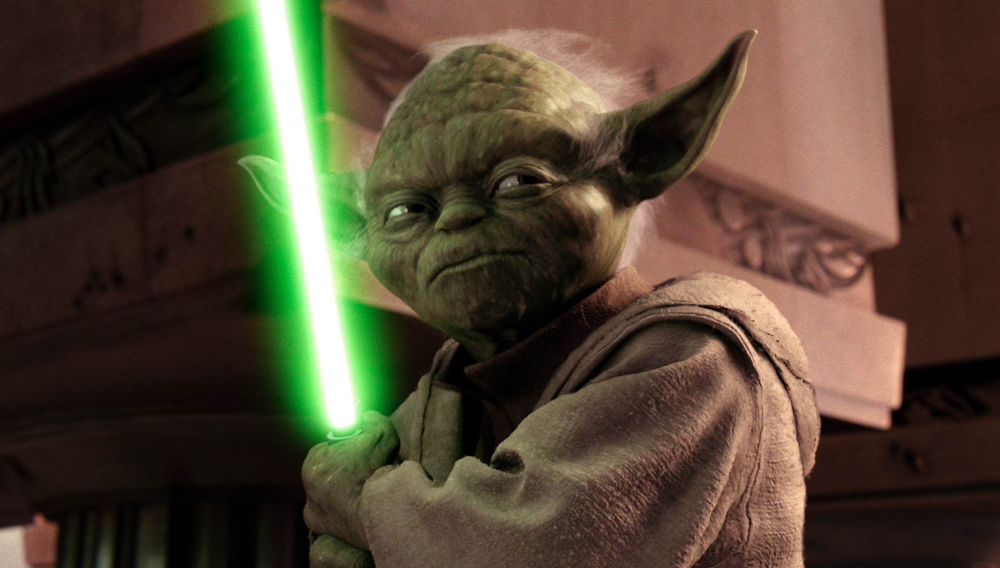

Caption: a photo of yoda in star wars episode ii attack of the clones


In [18]:
display(image)
print('Caption: {}'.format(result[0]['caption']))


# VQGAN+CLIP

![](https://compvis.github.io/taming-transformers/paper/teaser.png)

In [19]:
%cd /kaggle/working

/kaggle/working


In [ ]:
!pip install --user torch==1.9.0 torchvision==0.10.0 torchaudio==0.9.0 torchtext==0.10.0

In [20]:
# !git clone https://github.com/openai/CLIP
# !pip install taming-transformers
# !git clone https://github.com/CompVis/taming-transformers.git
# !pip install ftfy regex tqdm omegaconf pytorch-lightning
# !pip install kornia
# !pip install imageio-ffmpeg
# !pip install einops
# !mkdir steps

ERROR! Session/line number was not unique in database. History logging moved to new session 4


In [21]:
import torch

In [22]:
import os
import torch
torch.hub.download_url_to_file('https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1', 
                               'vqgan_imagenet_f16_16384.yaml')
torch.hub.download_url_to_file('https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1', 
                               'vqgan_imagenet_f16_16384.ckpt')
import argparse
import math
from pathlib import Path
import sys
sys.path.insert(1, './taming-transformers')

  0%|          | 0.00/692 [00:00<?, ?B/s]

  0%|          | 0.00/935M [00:00<?, ?B/s]

In [23]:
from base64 import b64encode
from omegaconf import OmegaConf
from PIL import Image
import matplotlib.pyplot as plt
from taming.models import cond_transformer, vqgan
import taming.modules 
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm
from CLIP import clip
import kornia.augmentation as K
import numpy as np
import imageio
from PIL import ImageFile, Image
from urllib.request import urlopen

ImageFile.LOAD_TRUNCATED_IMAGES = True
from pynvml.smi import nvmlInit, nvmlDeviceGetHandleByIndex, nvmlDeviceGetUtilizationRates
nvmlInit()
handle = nvmlDeviceGetHandleByIndex(0)

import warnings
warnings.filterwarnings("ignore")

In [24]:
torch.hub.download_url_to_file('https://images.pexels.com/photos/158028/bellingrath-gardens-alabama-landscape-scenic-158028.jpeg', 
                               'garden.jpeg')
torch.hub.download_url_to_file('https://images.pexels.com/photos/803975/pexels-photo-803975.jpeg', 
                               'cabin.jpeg')

  0%|          | 0.00/1.65M [00:00<?, ?B/s]

  0%|          | 0.00/2.28M [00:00<?, ?B/s]

In [25]:
def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))

def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()

def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]

def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size
    input = input.view([n * c, 1, h, w])
    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])
    
    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])
    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)

In [26]:
class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward
    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)
replace_grad = ReplaceGrad.apply

class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)
    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None
clamp_with_grad = ClampWithGrad.apply

In [27]:
def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)

class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))
    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()

def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])

In [28]:
class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow
        self.augs = nn.Sequential(
            K.RandomAffine(degrees=15, translate=0.1, p=0.7, padding_mode='border'),
            K.RandomPerspective(0.7,p=0.7),
            K.ColorJitter(hue=0.1, saturation=0.1, p=0.7),
            K.RandomErasing((.1, .4), (.3, 1/.3), same_on_batch=True, p=0.7),
        )
        self.noise_fac = 0.1
        self.av_pool = nn.AdaptiveAvgPool2d((self.cut_size, self.cut_size))
        self.max_pool = nn.AdaptiveMaxPool2d((self.cut_size, self.cut_size))

    def forward(self, input):
        slideY, slideX = input.shape[2:4]
        max_size = min(slideX, slideY)
        min_size = min(slideX, slideY, self.cut_size)
        cutouts = []

        for _ in range(self.cutn):
            cutout = (self.av_pool(input) + self.max_pool(input))/2
            cutouts.append(cutout)

        batch = self.augs(torch.cat(cutouts, dim=0))
        if self.noise_fac:
            facs = batch.new_empty([self.cutn, 1, 1, 1]).uniform_(0, self.noise_fac)
            batch = batch + facs * torch.randn_like(batch)
        return batch

In [29]:
def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)

    elif config.model.target == 'taming.models.vqgan.GumbelVQ':
        model = vqgan.GumbelVQ(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)

    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model

In [30]:
def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

In [31]:
torch.cuda.empty_cache()

In [32]:
model_name = "vqgan_imagenet_f16_16384" 
images_interval =  50
width =  512
height = 512
init_image = ""
seed = 42
BASE_PATH = '../input/flickr-image-dataset/flickr30k_images/flickr30k_images/'
args = argparse.Namespace(
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[width, height],
    init_image=init_image,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config=f'{model_name}.yaml',
    vqgan_checkpoint=f'{model_name}.ckpt',
    step_size=0.13,
    cutn=32,
    cut_pow=1.,
    display_freq=images_interval,
    seed=seed,
)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

Using device: cuda:0
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


In [33]:
def inference(text, 
              seed, 
              step_size,
              max_iterations,
              width, 
              height,
              init_image, 
              init_weight, 
              target_images, 
              cutn, 
              cut_pow,
              video_file
             ):
    all_frames = []
    size=[width, height]
    texts = text
    init_weight=init_weight

    if init_image:
        init_image = init_image
    else:
        init_image = ""
    if target_images:
        target_images = target_images
    else:
        target_images = ""
    max_iterations = max_iterations
    model_names={"vqgan_imagenet_f16_16384": 'ImageNet 16384',
                 "vqgan_imagenet_f16_1024":"ImageNet 1024", 
                 'vqgan_openimages_f16_8192':'OpenImages 8912',
                 "wikiart_1024":"WikiArt 1024", 
                 "wikiart_16384":"WikiArt 16384", 
                 "coco":"COCO-Stuff",
                 "faceshq":"FacesHQ",
                 "sflckr":"S-FLCKR"}
    name_model = model_names[model_name]
    if target_images == "None" or not target_images:
        target_images = []
    else:
        target_images = target_images.split("|")
        target_images = [image.strip() for image in target_images]

    texts = [phrase.strip() for phrase in texts.split("|")]
    if texts == ['']:
        texts = []
    if texts:
        print('Using texts:', texts)
    if target_images:
        print('Using image prompts:', target_images)
    if seed is None or seed == -1:
        seed = torch.seed()
    else:
        seed = seed
    torch.manual_seed(seed)
    print('Using seed:', seed)

    cut_size = perceptor.visual.input_resolution
    f = 2**(model.decoder.num_resolutions - 1)
    make_cutouts = MakeCutouts(cut_size, cutn, cut_pow=cut_pow)
    toksX, toksY = size[0] // f, size[1] // f
    sideX, sideY = toksX * f, toksY * f

    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        e_dim = 256
        n_toks = model.quantize.n_embed
        z_min = model.quantize.embed.weight.min(dim=0).values[None, :, None, None]
        z_max = model.quantize.embed.weight.max(dim=0).values[None, :, None, None]
    else:
        e_dim = model.quantize.e_dim
        n_toks = model.quantize.n_e
        z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
        z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]

    if init_image:
        if 'http' in init_image:
            img = Image.open(urlopen(init_image))
        else:
            img = Image.open(init_image)
        pil_image = img.convert('RGB')
        pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
        pil_tensor = TF.to_tensor(pil_image)
        z, *_ = model.encode(pil_tensor.to(device).unsqueeze(0) * 2 - 1)
    else:
        one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
        # z = one_hot @ model.quantize.embedding.weight
        if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
            z = one_hot @ model.quantize.embed.weight
        else:
            z = one_hot @ model.quantize.embedding.weight
        z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2) 
        z = torch.rand_like(z)*2
    z_orig = z.clone()
    z.requires_grad_(True)
    opt = optim.Adam([z], lr=step_size)
    normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                    std=[0.26862954, 0.26130258, 0.27577711])
    pMs = []
    for prompt in texts:
        txt, weight, stop = parse_prompt(prompt)
        embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))
    for prompt in target_images:
        path, weight, stop = parse_prompt(prompt)
        img = Image.open(path)
        pil_image = img.convert('RGB')
        img = resize_image(pil_image, (sideX, sideY))
        batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
        embed = perceptor.encode_image(normalize(batch)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))
    for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
        gen = torch.Generator().manual_seed(seed)
        embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
        pMs.append(Prompt(embed, weight).to(device))

    def synth(z):
        if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
            z_q = vector_quantize(z.movedim(1, 3), model.quantize.embed.weight).movedim(3, 1)
        else:
            z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
        return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)
    @torch.no_grad()
    def checkin(i, losses):
        losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
        tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
        out = synth(z)
        # TF.to_pil_image(out[0].cpu()).save('progress.png')
        # display.display(display.Image('progress.png'))
        res = nvmlDeviceGetUtilizationRates(handle)
        print(f'gpu: {res.gpu}%, gpu-mem: {res.memory}%')
    def ascend_txt():
        # global i
        out = synth(z)
        iii = perceptor.encode_image(normalize(make_cutouts(out))).float()
        
        result = []
        if init_weight:
            result.append(F.mse_loss(z, z_orig) * init_weight / 2)
            #result.append(F.mse_loss(z, torch.zeros_like(z_orig)) * ((1/torch.tensor(i*2 + 1))*init_weight) / 2)
        for prompt in pMs:
            result.append(prompt(iii))
        img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
        img = np.transpose(img, (1, 2, 0))
        # imageio.imwrite('./steps/' + str(i) + '.png', np.array(img))
        img = Image.fromarray(img).convert('RGB')
        all_frames.append(img)
        return result, np.array(img)
    def train(i):
        opt.zero_grad()
        lossAll, image = ascend_txt()
        if i % args.display_freq == 0:
            checkin(i, lossAll)
        
        loss = sum(lossAll)
        loss.backward()
        opt.step()
        with torch.no_grad():
            z.copy_(z.maximum(z_min).minimum(z_max))
        return image
    i = 0
    try:
        with tqdm() as pbar:
            while True:
                image = train(i)
                if i == max_iterations:
                    break
                i += 1
                pbar.update()
    except KeyboardInterrupt:
        pass
    writer = imageio.get_writer(video_file + '.mp4', fps=20)
    for im in all_frames:
        writer.append_data(np.array(im))
    writer.close()
    # all_frames[0].save('out.gif',
              # save_all=True, append_images=all_frames[1:], optimize=False, duration=80, loop=0)
    return image


In [34]:
def load_image( infilename ) :
    img = Image.open( infilename )
    img.load()
    data = np.asarray( img, dtype="int32" )
    return data

In [35]:
def display_result(img) :
    plt.figure(figsize=(9,9))
    plt.imshow(img)
    plt.axis('off')

Using texts: ['A shop in mars']
Using seed: 2502


0it [00:00, ?it/s]

i: 0, loss: 0.910059, losses: 0, 0.910059
gpu: 23%, gpu-mem: 8%
i: 50, loss: 0.805712, losses: 0.00310011, 0.802612
gpu: 71%, gpu-mem: 15%
i: 100, loss: 0.76032, losses: 0.00334881, 0.756971
gpu: 68%, gpu-mem: 14%
i: 150, loss: 0.659521, losses: 0.00352085, 0.656
gpu: 94%, gpu-mem: 21%
i: 200, loss: 0.687969, losses: 0.00375274, 0.684216
gpu: 67%, gpu-mem: 12%
i: 250, loss: 0.644398, losses: 0.00396585, 0.640433
gpu: 95%, gpu-mem: 27%
i: 300, loss: 0.730118, losses: 0.00421882, 0.725899
gpu: 67%, gpu-mem: 16%


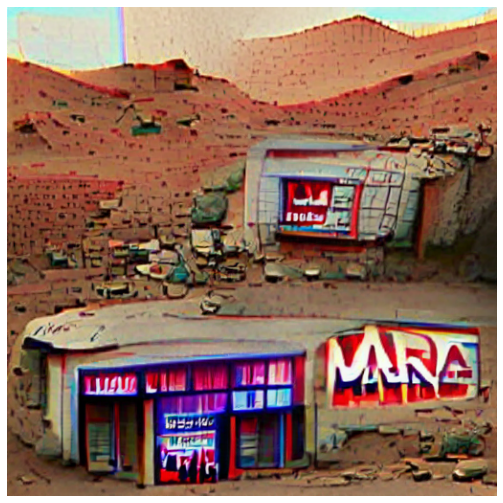

In [36]:
img = inference(
    text = 'A shop in mars', 
    seed = 2502,
    step_size = 0.14,
    max_iterations = 300,
    width = 512,
    height = 512,
    init_image = '',
    init_weight = 0.004, 
    target_images = '', 
    cutn = 64,
    cut_pow = 1.0,
    video_file = "test1"
)
display_result(img)

In [37]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('test1.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=500 loop="true" autoplay="autoplay" controls muted>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)